Name: Hassan Mansoor

CMS: 403544

Class: BSCS12A

Deep Learning Assign 03

# **Le2i Fall Dataset**

# **Prepare Video Labels**

Imports

In [ ]:
import os
import cv2
import numpy as np
import glob
from tqdm import tqdm
import matplotlib.pyplot as plt

In [ ]:
folder_path = '/content/Le2i Dataset/Coffee_room_02'# small renaming folder fix
old_folder_name = 'Annotations_files'
new_folder_name = 'Annotation_files'
old_folder_path = os.path.join(folder_path, old_folder_name)
new_folder_path = os.path.join(folder_path, new_folder_name)

if os.path.exists(old_folder_path):
    os.rename(old_folder_path, new_folder_path)


In [ ]:
def get_fall_labels(annotation_file):
    """
    Reads the annotation file and returns the fall start and end frame numbers.

    Args:
        annotation_file (str): Path to the annotation .txt file.

    Returns:
        tuple: (fall_start, fall_end) as integers.
    """
    with open(annotation_file, "r") as f:
        lines = f.readlines()
        fall_start = int(lines[0].strip())
        fall_end = int(lines[1].strip())
    return fall_start, fall_end

In [ ]:
def process_video(video_path, annotation_path, folder_name):
    """
    Processes a single video and returns a list of frame-label data.

    Args:
        video_path (str): Path to the .avi video file.
        annotation_path (str): Corresponding annotation .txt file path.
        folder_name (str): Folder category (e.g., Home_01, Coffee_room_01).

    Returns:
        list of dict: Each dict contains frame, label, metadata.
    """
    video_name = os.path.basename(video_path)

    # Check if annotation exists
    if not os.path.exists(annotation_path):
        print(f"⚠️ Skipping {video_name} due to missing annotation.")
        return []

    try:
        fall_start, fall_end = get_fall_labels(annotation_path)
    except Exception as e:
        print(f"⚠️ Error reading annotation {annotation_path}: {e}")
        return []

    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    video_frames = []
    for frame_num in range(total_frames):
        ret, frame = cap.read()
        if not ret:
            break

        label = 1 if fall_start <= frame_num <= fall_end else 0  # 1 = Fall, 0 = No Fall

        video_frames.append({
            "frame": frame,
            "label": label,
            "folder": folder_name,
            "video": video_name,
            "frame_num": frame_num
        })

    cap.release()
    print(f"✅ Processed {video_name} | Total Frames: {len(video_frames)}")
    return video_frames

In [ ]:
def collect_dataset(base_path):
    """
    Traverses all video folders, reads videos and annotations, and labels all frames.

    Args:
        base_path (str): Root path containing dataset folders.

    Returns:
        list of dict: Complete dataset of frames and their fall labels.
    """
    valid_folders = ["Coffee_room_01", "Coffee_room_02", "Home_01", "Home_02"]
    all_data = []

    for folder in valid_folders:
        print(f"\n🔍 Processing Folder: {folder}")
        videos_path = os.path.join(base_path, folder, "Videos")
        annotations_path = os.path.join(base_path, folder, "Annotation_files")

        video_files = sorted(glob.glob(os.path.join(videos_path, "*.avi")))

        for video_file in video_files:
            annotation_file = os.path.join(annotations_path, os.path.basename(video_file).replace(".avi", ".txt"))
            video_data = process_video(video_file, annotation_file, folder)
            all_data.extend(video_data)

    return all_data

In [ ]:
dataset_path = "/content/Le2i Dataset"

print("Loading dataset and labeling frames:\n")
frame_data = collect_dataset(dataset_path)
print(f"Total labeled frames collected: {len(frame_data)}")

Loading dataset and labeling frames:


🔍 Processing Folder: Coffee_room_01
✅ Processed video (1).avi | Total Frames: 157
✅ Processed video (10).avi | Total Frames: 362
✅ Processed video (11).avi | Total Frames: 483
✅ Processed video (12).avi | Total Frames: 182
✅ Processed video (13).avi | Total Frames: 244
✅ Processed video (14).avi | Total Frames: 176
✅ Processed video (15).avi | Total Frames: 140
✅ Processed video (16).avi | Total Frames: 177
✅ Processed video (17).avi | Total Frames: 158
✅ Processed video (18).avi | Total Frames: 269
✅ Processed video (19).avi | Total Frames: 213
✅ Processed video (2).avi | Total Frames: 306
✅ Processed video (20).avi | Total Frames: 444
✅ Processed video (21).avi | Total Frames: 182
✅ Processed video (22).avi | Total Frames: 229
✅ Processed video (23).avi | Total Frames: 311
✅ Processed video (24).avi | Total Frames: 267
✅ Processed video (25).avi | Total Frames: 262
⚠️ Error reading annotation /content/Le2i Dataset/Coffee_room_01/Annotation_files

# **Pose Estimation With MediaPipe**

In [ ]:
import mediapipe as mp

In [ ]:
# setup
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=False, min_detection_confidence=0.5, model_complexity=1)
mp_drawing = mp.solutions.drawing_utils

def extract_keypoints_from_frame(frame):
    """
    Extract pose keypoints using MediaPipe from a given frame.

    Args:
        frame (np.array): BGR image/frame.

    Returns:
        np.array or None: Flattened keypoints array (x1, y1, z1, visibility1, ...), or None if no pose detected.
    """
    image_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = pose.process(image_rgb)

    if results.pose_landmarks:
        keypoints = []
        for lm in results.pose_landmarks.landmark:
            keypoints.extend([lm.x, lm.y, lm.z, lm.visibility])
        return np.array(keypoints)
    else:
        return None


In [ ]:
keypoint_data = []

print("Extracting pose keypoints from frames:\n")

for item in tqdm(frame_data):
    frame = item["frame"]
    label = item["label"]
    folder = item["folder"]
    video = item["video"]
    frame_num = item["frame_num"]

    keypoints = extract_keypoints_from_frame(frame)

    if keypoints is not None:
        keypoint_data.append({
            "keypoints": keypoints,
            "label": label,
            "folder": folder,
            "video": video,
            "frame_num": frame_num
        })

print(f"Keypoints extracted from {len(keypoint_data)} frames.")

Extracting pose keypoints from frames:



100%|██████████| 39619/39619 [28:45<00:00, 22.96it/s]

Keypoints extracted from 35978 frames.


**Let's save our extracted keypoints**

In [ ]:
import numpy as np

# Extract arrays
X = np.array([entry["keypoints"] for entry in keypoint_data])  # shape: (num_samples, num_features)
y = np.array([entry["label"] for entry in keypoint_data])      # shape: (num_samples,)


In [ ]:
np.savez("le2i_pose_data.npz", X=X, y=y)
print("📁 Saved keypoints and labels to le2i_pose_data.npz")


📁 Saved keypoints and labels to le2i_pose_data.npz


In [ ]:
import pickle

with open("le2i_pose_keypoints.pkl", "wb") as f:
    pickle.dump(keypoint_data, f)

print("Keypoint data saved to le2i_pose_keypoints.pkl")


Keypoint data saved to le2i_pose_keypoints.pkl


In [ ]:
import shutil

# src
source_path = '/content/le2i_pose_data.npz'

# dst
destination_path = '/content/drive/MyDrive/le2i_pose_data.npz'

# Copy file
shutil.copy(source_path, destination_path)

print(f"File copied to Drive: {destination_path}")


File copied to Drive: /content/drive/MyDrive/le2i_pose_data.npz


In [ ]:
import shutil

# src
source_path = '/content/le2i_pose_keypoints.pkl'

# dst
destination_path = '/content/drive/MyDrive/le2i_pose_keypoints.pkl'

# Copy file
shutil.copy(source_path, destination_path)

print(f"File copied to Drive: {destination_path}")


File copied to Drive: /content/drive/MyDrive/le2i_pose_keypoints.pkl


# **Let's Visualise Some Videos With Keypoints**

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import PillowWriter

In [ ]:
# Choose a video from the dataset
video_path = '/content/Le2i Dataset/Coffee_room_01/Videos/video (1).avi'
annotation_path = '/content/Le2i Dataset/Coffee_room_01/Annotation_files/video (1).txt'

In [ ]:
# Process the video and extract keypoints
cap = cv2.VideoCapture(video_path)

# Set up the Pose Estimation and Drawing utilities
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=False, min_detection_confidence=0.5, model_complexity=1)
mp_drawing = mp.solutions.drawing_utils

In [ ]:
def extract_keypoints(frame):
    image_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = pose.process(image_rgb)

    keypoints = None
    if results.pose_landmarks:
        keypoints = []
        for lm in results.pose_landmarks.landmark:
            keypoints.extend([lm.x, lm.y, lm.z, lm.visibility])
    return keypoints, results.pose_landmarks

Save Frames

In [ ]:
frames_for_gif = []

# read frames from the video....
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Extract keypoints from the frame
    keypoints, landmarks = extract_keypoints(frame)

    if keypoints is not None:
        # Overlay the keypoints on the frame
        frame_with_keypoints = frame.copy()
        mp_drawing.draw_landmarks(frame_with_keypoints, landmarks, mp_pose.POSE_CONNECTIONS)

        # Append frame for GIF creation
        frames_for_gif.append(cv2.cvtColor(frame_with_keypoints, cv2.COLOR_BGR2RGB))

cap.release()

# Create a GIF from the frames
fig, ax = plt.subplots(figsize=(10, 10))

def update_frame(i):
    ax.clear()
    ax.imshow(frames_for_gif[i])
    ax.axis('off')


create animation

Save Frames

create animation

In [ ]:
ani = animation.FuncAnimation(fig, update_frame, frames=len(frames_for_gif), interval=50)

In [ ]:
# get gif
gif_path = '/content/non_fall1.gif'
writer = PillowWriter(fps=6)
ani.save(gif_path, writer=writer)

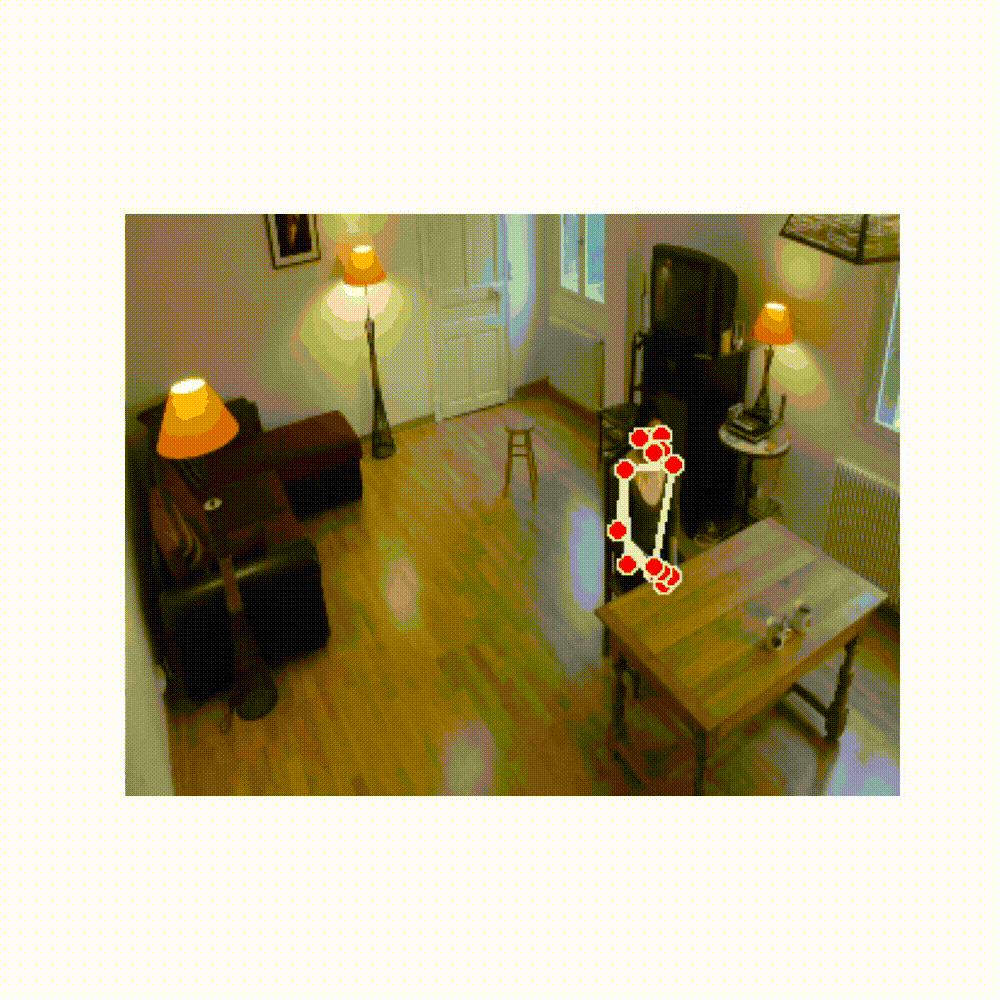

In [40]:
from IPython.display import Image
Image(filename='/content/nonfall.gif')

# **Feature Engineering and Feature Extraction**

Angle between 3 points

In [42]:
def calculate_angle(a, b, c):
    """
    Calculates angle (in degrees) formed at point b by points a and c.
    """
    a, b, c = np.array(a), np.array(b), np.array(c)
    ba = a - b
    bc = c - b
    cosine_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc) + 1e-6)
    angle = np.arccos(np.clip(cosine_angle, -1.0, 1.0))
    return np.degrees(angle)

Compute angles

In [43]:
def compute_joint_angles(coords):
    """
    Compute key joint angles from pose keypoints.
    """
    L_SHOULDER, R_SHOULDER = coords[11], coords[12]
    L_ELBOW, R_ELBOW = coords[13], coords[14]
    L_WRIST, R_WRIST = coords[15], coords[16]
    L_HIP, R_HIP = coords[23], coords[24]
    L_KNEE, R_KNEE = coords[25], coords[26]
    L_ANKLE, R_ANKLE = coords[27], coords[28]

    left_elbow_angle = calculate_angle(L_SHOULDER[:2], L_ELBOW[:2], L_WRIST[:2])
    right_elbow_angle = calculate_angle(R_SHOULDER[:2], R_ELBOW[:2], R_WRIST[:2])
    left_knee_angle = calculate_angle(L_HIP[:2], L_KNEE[:2], L_ANKLE[:2])
    right_knee_angle = calculate_angle(R_HIP[:2], R_KNEE[:2], R_ANKLE[:2])

    return left_elbow_angle, right_elbow_angle, left_knee_angle, right_knee_angle

Center of gravity

In [44]:
def compute_cog(coords):
    """
    Compute center of gravity (average of shoulders and hips).
    """
    L_SHOULDER, R_SHOULDER = coords[11], coords[12]
    L_HIP, R_HIP = coords[23], coords[24]
    cog = np.mean([L_SHOULDER, R_SHOULDER, L_HIP, R_HIP], axis=0)
    return cog

Velocity/Acceleration

In [45]:
def compute_velocity_and_acceleration(video, coords, prev_points, prev_velocities):
    """
    Compute mean velocity and acceleration for shoulders and hips.
    """
    velocities = []
    accelerations = []

    if video not in prev_points:
        prev_points[video] = {}
        prev_velocities[video] = {}

    for j in [11, 12, 23, 24]:  # shoulders and hips
        point = coords[j][:2]

        if j in prev_points[video]:
            vel = np.linalg.norm(point - prev_points[video][j])
            velocities.append(vel)

            if j in prev_velocities[video]:
                acc = abs(vel - prev_velocities[video][j])
                accelerations.append(acc)
            else:
                accelerations.append(0)

            prev_velocities[video][j] = vel
        else:
            velocities.append(0)
            accelerations.append(0)
            prev_velocities[video][j] = 0

        prev_points[video][j] = point

    return np.mean(velocities), np.mean(accelerations)

Extract the features

In [46]:
def extract_features_from_keypoints(keypoint_data):
    """
    Main function to extract all features for each frame.
    """
    features = []
    prev_points = {}      # for velocity
    prev_velocities = {}  # for acceleration

    for item in keypoint_data:
        video = item["video"]
        frame_num = item["frame_num"]
        label = item["label"]
        kps = item["keypoints"].reshape((33, 4))
        coords = kps[:, :3]
        visibility = kps[:, 3]

        # Extract individual features
        left_elbow_angle, right_elbow_angle, left_knee_angle, right_knee_angle = compute_joint_angles(coords)
        cog = compute_cog(coords)
        velocity_mean, acceleration_mean = compute_velocity_and_acceleration(video, coords, prev_points, prev_velocities)
        avg_confidence = np.mean(visibility)

        # Store feature dict
        features.append({
            "video": video,
            "frame_num": frame_num,
            "label": label,
            "left_elbow_angle": left_elbow_angle,
            "right_elbow_angle": right_elbow_angle,
            "left_knee_angle": left_knee_angle,
            "right_knee_angle": right_knee_angle,
            "cog_x": cog[0],
            "cog_y": cog[1],
            "cog_z": cog[2],
            "velocity_mean": velocity_mean,
            "acceleration_mean": acceleration_mean,
            "avg_confidence": avg_confidence
        })

    return features

In [49]:
import pandas as pd
def convert_features_to_dataframe(features):
    return pd.DataFrame(features)

def save_features_to_csv(features_df, output_path="fall_features_output.csv"):
    features_df.to_csv(output_path, index=False)
    print(f"✅ Features saved to {output_path}")

run the functions

In [50]:
features = extract_features_from_keypoints(keypoint_data)
features_df = convert_features_to_dataframe(features)
save_features_to_csv(features_df)

✅ Features saved to fall_features_output.csv


We'll use a sliding window approach to generate sequences of features across consecutive frames, which helps the classifier learn temporal dynamics.

In [51]:
def create_feature_sequences(features_df, window_size=30, stride=1):
    """
    Create temporal sequences from features with a fixed window size.
    """
    sequences = []
    labels = []

    grouped = features_df.groupby("video")

    for video_name, group in grouped:
        group = group.sort_values("frame_num").reset_index(drop=True)
        data = group.drop(columns=["video", "frame_num", "label"]).values
        label_data = group["label"].values

        for start in range(0, len(group) - window_size + 1, stride):
            end = start + window_size
            window = data[start:end]
            label_window = label_data[start:end]

            # Label the window as 1 (fall) if any frame in the sequence has label==1
            sequence_label = 1 if np.any(label_window) else 0

            sequences.append(window)
            labels.append(sequence_label)

    return np.array(sequences), np.array(labels)


In [52]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

def prepare_train_test_data(sequences, labels, test_size=0.2):
    # Flatten each sequence for normalization (samples, features)
    num_samples, timesteps, num_features = sequences.shape
    sequences_reshaped = sequences.reshape(num_samples * timesteps, num_features)

    scaler = StandardScaler()
    sequences_normalized = scaler.fit_transform(sequences_reshaped)
    sequences = sequences_normalized.reshape(num_samples, timesteps, num_features)

    return train_test_split(sequences, labels, test_size=test_size, random_state=42, stratify=labels)


LSTM Classifier

In [53]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(64, return_sequences=True, input_shape=input_shape),
        Dropout(0.3),
        LSTM(32),
        Dense(16, activation='relu'),
        Dropout(0.2),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model


Train/Evaluate

In [54]:
sequences, labels = create_feature_sequences(features_df, window_size=30, stride=5) # sequences

In [55]:
# Train/Test split
X_train, X_test, y_train, y_test = prepare_train_test_data(sequences, labels)

# build model
model = build_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [56]:
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2) # training

Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - accuracy: 0.8516 - loss: 0.4276 - val_accuracy: 0.9258 - val_loss: 0.2123
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - accuracy: 0.9218 - loss: 0.2096 - val_accuracy: 0.9505 - val_loss: 0.1707
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - accuracy: 0.9377 - loss: 0.1765 - val_accuracy: 0.9423 - val_loss: 0.1546
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.9303 - loss: 0.1770 - val_accuracy: 0.9450 - val_loss: 0.1610
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - accuracy: 0.9455 - loss: 0.1457 - val_accuracy: 0.9597 - val_loss: 0.1279
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - accuracy: 0.9489 - loss: 0.1366 - val_accuracy: 0.9487 - val_loss: 0.1372
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - accuracy: 0.9512 - loss: 0.1310 - val_accuracy: 0.9652 - val_loss: 0.1142
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - accuracy: 0.9497 - loss: 0.1220 - val_accu

# **Evaluate with Binary Classification Metrics**

In [61]:
from sklearn.metrics import classification_report

def evaluate_model(model, X_test, y_test):
    y_pred_probs = model.predict(X_test)
    y_pred = (y_pred_probs > 0.5).astype(int)

    print("Classification Report:")
    print(classification_report(y_test, y_pred, target_names=["No Fall", "Fall"]))


In [62]:
evaluate_model(model, X_test, y_test)

43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Classification Report:
              precision    recall  f1-score   support

     No Fall       0.97      0.98      0.97      1123
        Fall       0.91      0.84      0.88       241

    accuracy                           0.96      1364
   macro avg       0.94      0.91      0.92      1364
weighted avg       0.96      0.96      0.96      1364



# **Results:**

The classification report shows that our model performs very well overall, with an accuracy of 96%. It detects "No Fall" cases with high precision and recall (97–98%), meaning it rarely misses or wrongly labels normal activities. For "Fall" cases, it achieves 91% precision and 84% recall, which indicates it’s fairly good at detecting falls, though there's some room for improvement in catching all of them. The F1-score of 0.88 for falls shows a strong balance between precision and recall.

----------------------- end